In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Train Dataset

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Bank%20Marketing/termdeposit_train.csv")

In [3]:
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,40576,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,15320,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,43962,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,29842,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,management,single,tertiary,no,0,yes,no,cellular,12,may,116,2,-1,0,unknown,no
31643,40178,53,management,divorced,tertiary,no,380,no,yes,cellular,5,jun,438,2,-1,0,unknown,yes
31644,19710,32,management,single,tertiary,no,312,no,no,cellular,7,aug,37,3,-1,0,unknown,no
31645,38556,57,technician,married,secondary,no,225,yes,no,telephone,15,may,22,7,337,12,failure,no


<font size='4'>**Check Numeric and Categorical Features**

<font size='4'>**Numeric Data**

In [4]:
numeric_data = df.select_dtypes(include=np.number)
numeric_col = numeric_data.columns
print("===="*20)
print("Numeric Features:")
print(numeric_data.head())
print("===="*20)

Numeric Features:
      ID  age  balance  day  duration  campaign  pdays  previous
0  26110   56     1933   19        44         2     -1         0
1  40576   31        3   20        91         2     -1         0
2  15320   27      891   18       240         1     -1         0
3  43962   57     3287   22       867         1     84         3
4  29842   31      119    4       380         1     -1         0


<font size='4'>**Categorical Data**

In [5]:
categorical_data = df.select_dtypes(exclude=np.number)
categorical_col = categorical_data.columns

print("===="*20)
print("Categorical Features:")
print(categorical_data.head())
print("===="*20)

Categorical Features:
          job   marital  education default housing loan    contact month  \
0      admin.   married    unknown      no      no   no  telephone   nov   
1     unknown   married  secondary      no      no   no   cellular   jul   
2    services   married  secondary      no     yes   no   cellular   jul   
3  management  divorced   tertiary      no      no   no   cellular   jun   
4  technician   married  secondary      no     yes   no   cellular   feb   

  poutcome subscribed  
0  unknown         no  
1  unknown         no  
2  unknown         no  
3  success        yes  
4  unknown         no  


<font size='4'>**CHECK THE DATATYPES**

In [6]:
print(df.dtypes)

ID             int64
age            int64
job           object
marital       object
education     object
default       object
balance        int64
housing       object
loan          object
contact       object
day            int64
month         object
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome      object
subscribed    object
dtype: object


<font size='4'>**CHECK THE NON-NULL**

In [7]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31647 entries, 0 to 31646
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID          31647 non-null  int64 
 1   age         31647 non-null  int64 
 2   job         31647 non-null  object
 3   marital     31647 non-null  object
 4   education   31647 non-null  object
 5   default     31647 non-null  object
 6   balance     31647 non-null  int64 
 7   housing     31647 non-null  object
 8   loan        31647 non-null  object
 9   contact     31647 non-null  object
 10  day         31647 non-null  int64 
 11  month       31647 non-null  object
 12  duration    31647 non-null  int64 
 13  campaign    31647 non-null  int64 
 14  pdays       31647 non-null  int64 
 15  previous    31647 non-null  int64 
 16  poutcome    31647 non-null  object
 17  subscribed  31647 non-null  object
dtypes: int64(8), object(10)
memory usage: 4.3+ MB
None


<font size='5'>**Check for Class Imbalance**

In [8]:
class_values = (df['subscribed'].value_counts()/df['subscribed'].value_counts().sum())*100
print(class_values)

no     88.261131
yes    11.738869
Name: subscribed, dtype: float64


<font size='3'>**Observations :-**

- The class distribution in the target is ~88:12. This is a clear indication of imbalance.

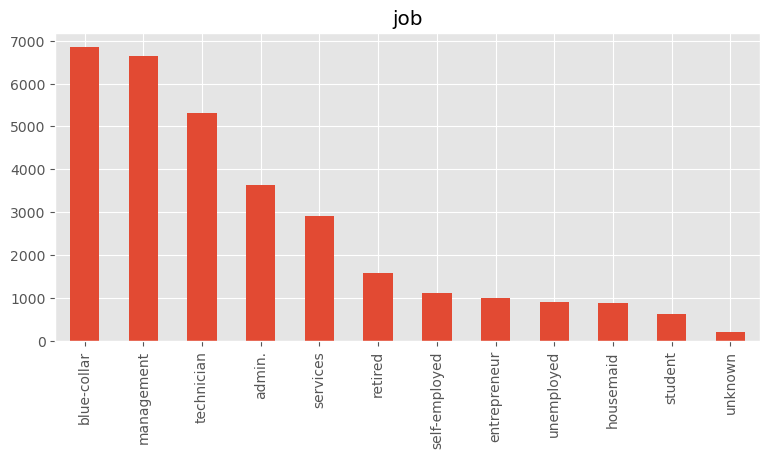

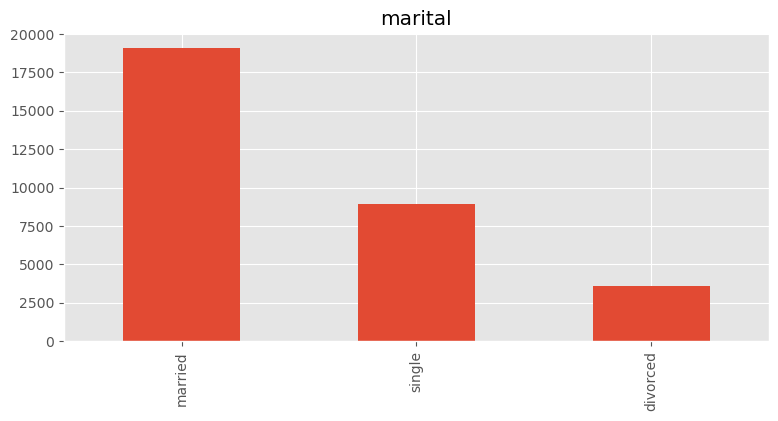

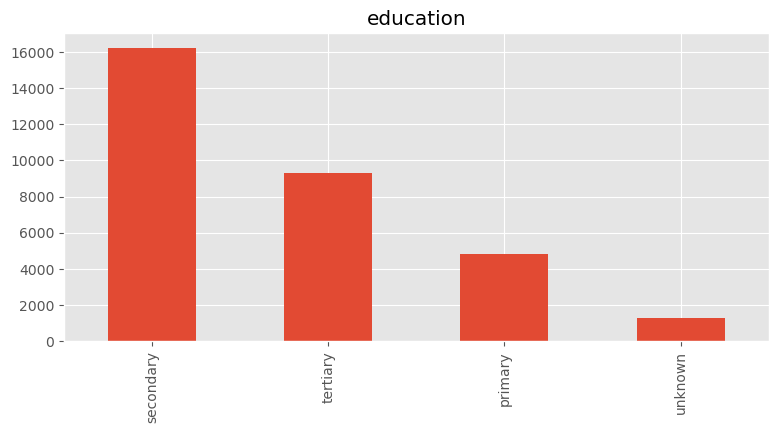

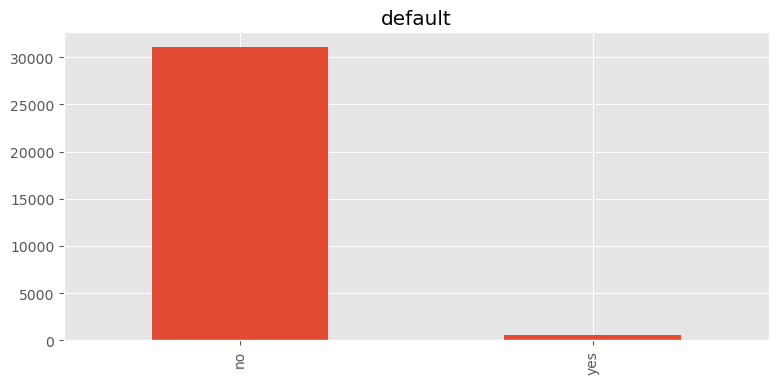

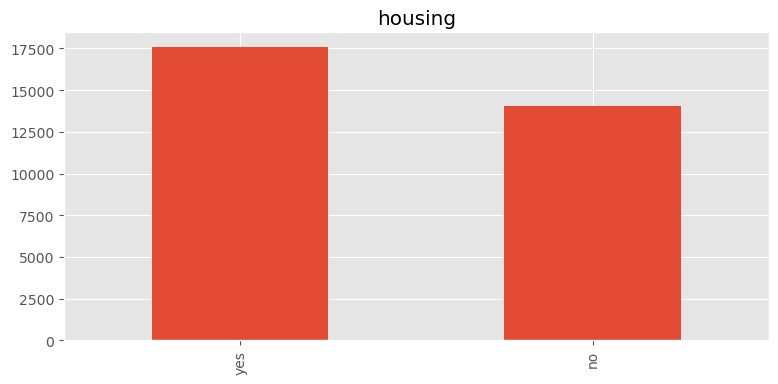

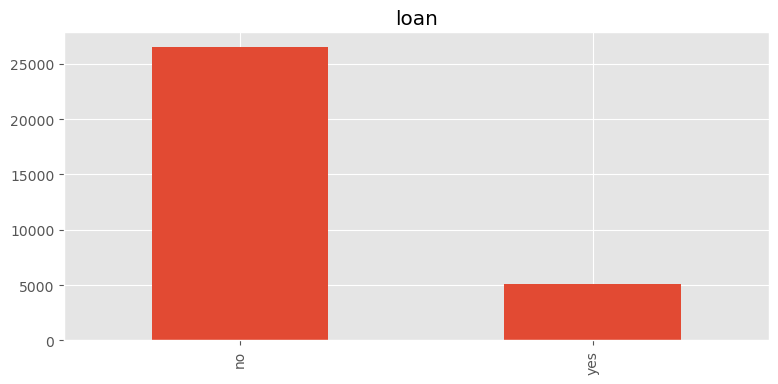

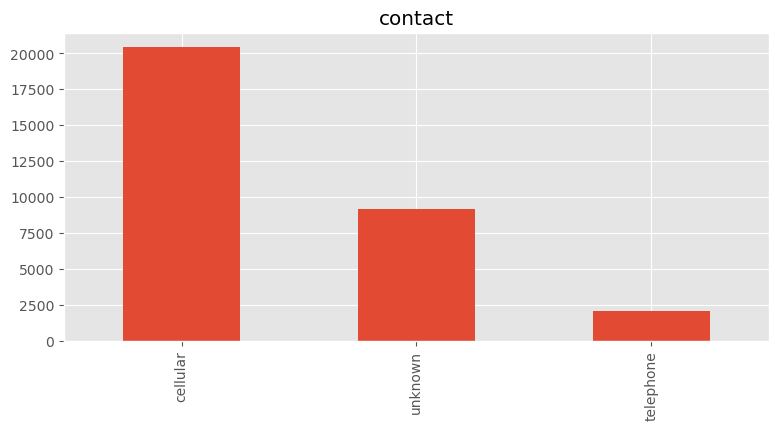

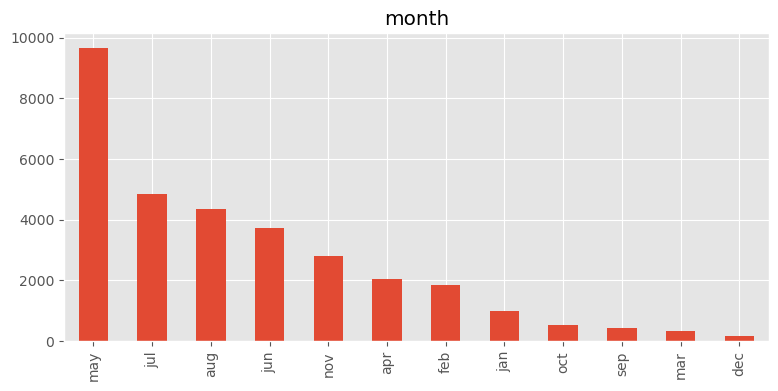

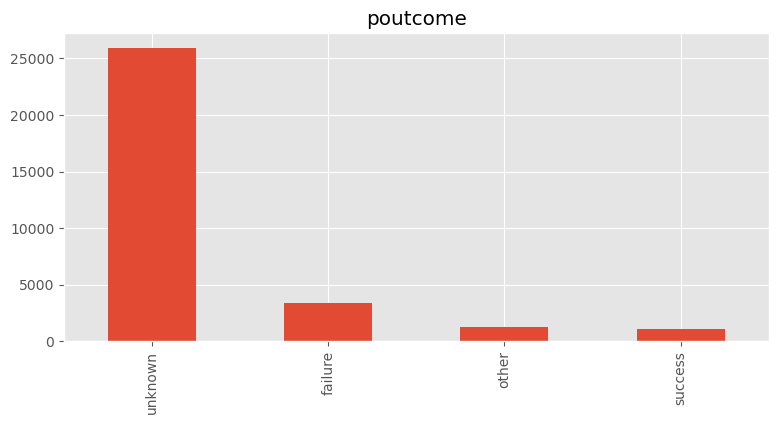

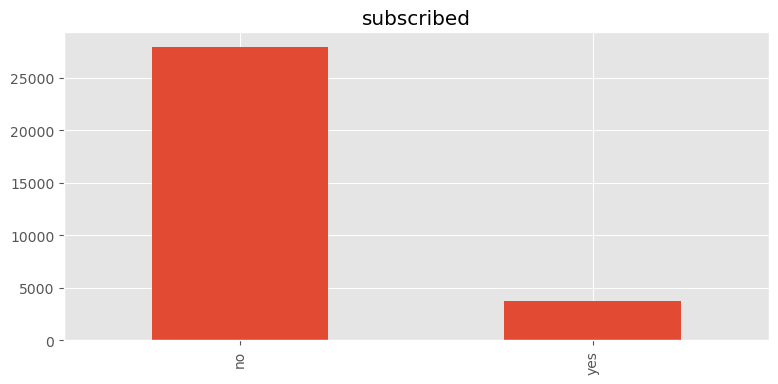

In [9]:
categorical_col = df.select_dtypes(include=['object']).columns
plt.style.use('ggplot')
for column in categorical_col:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    df[column].value_counts().plot(kind='bar')
    plt.title(column)

<font size='3'>**Observations :-**
 
- From the above visuals, we can make the following observations:

- The top three professions that our customers belong to are - administration, blue-collar jobs and technicians.

- A huge number of the customers are married.

- Majority of the customers do not have a credit in default

- Many of our past customers have applied for a housing loan but very few have applied for personal loans.

- Cell-phones seem to be the most favoured method of reaching out to customers.

- Many customers have been contacted in the month of May.

- The plot for the target variable shows heavy imbalance in the target variable.

- The missing values in some columns have been represented as unknown. unknown represents missing data. In the next task, we       will treat these values.

<font size='4'>**Imputing 'unknown' values of categorical columns**

In [10]:
for column in categorical_col:
    mode = df[column].mode()[0]
    df[column] = df[column].replace('unknown',mode)

<font size='3'>**Univariate analysis of Continuous columns**

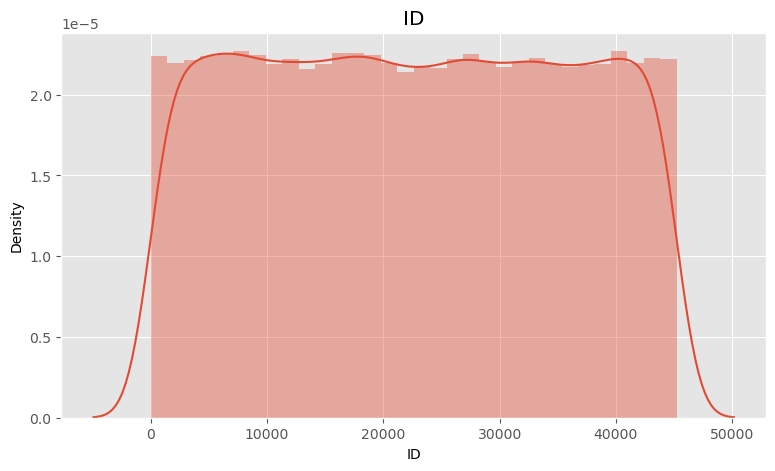

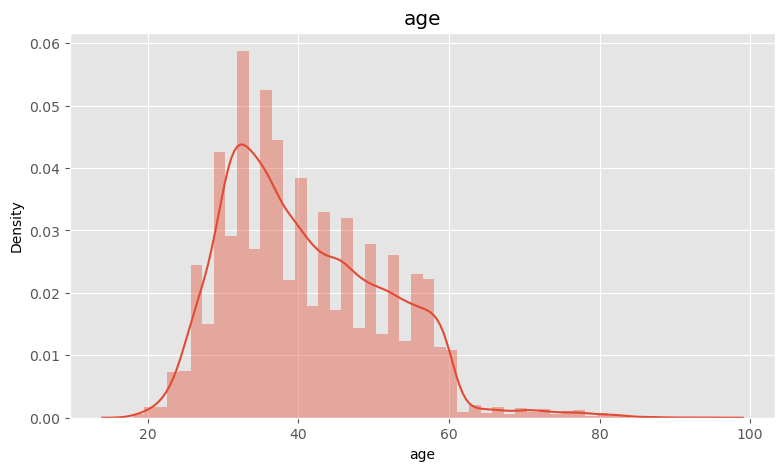

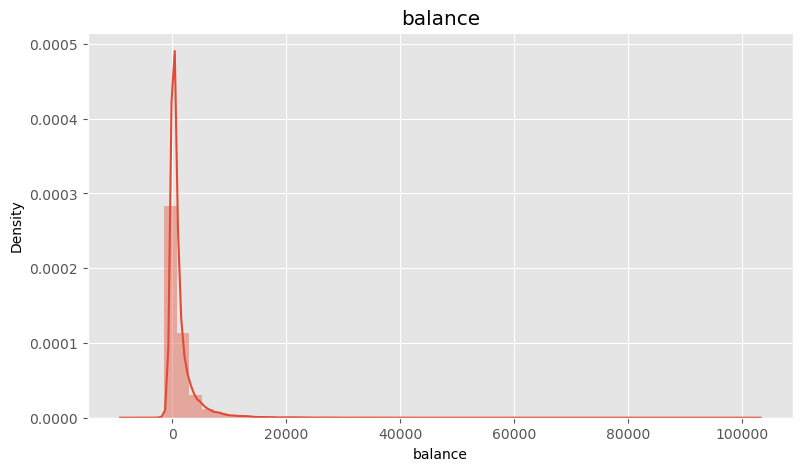

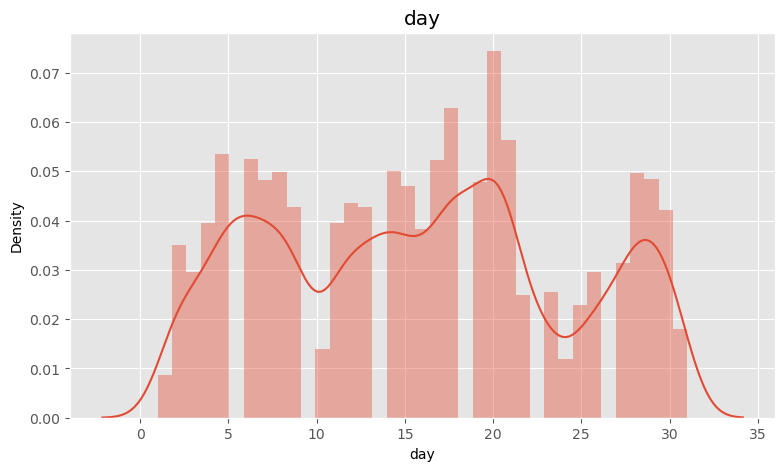

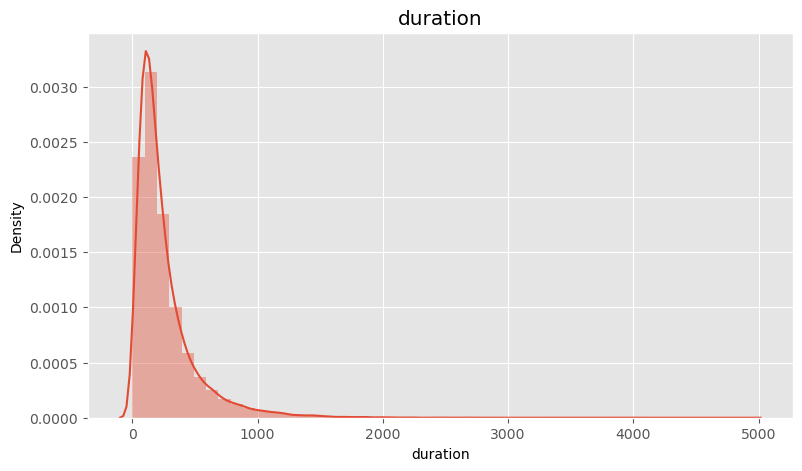

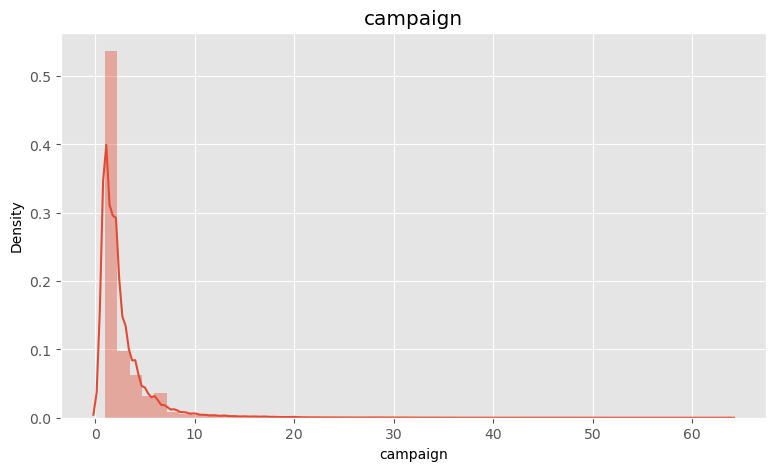

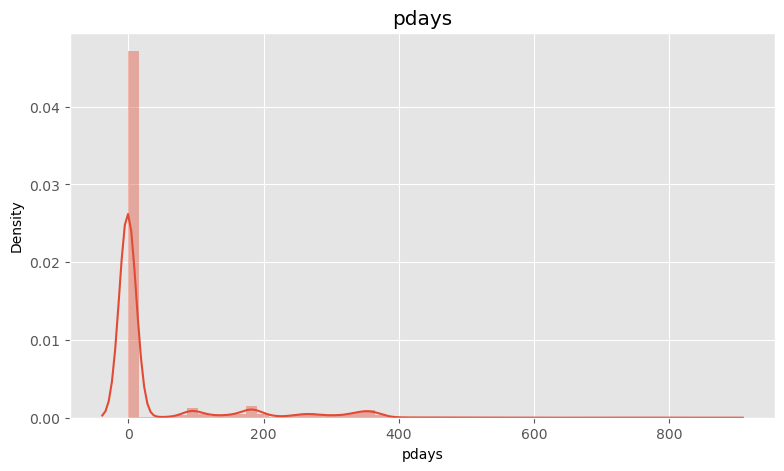

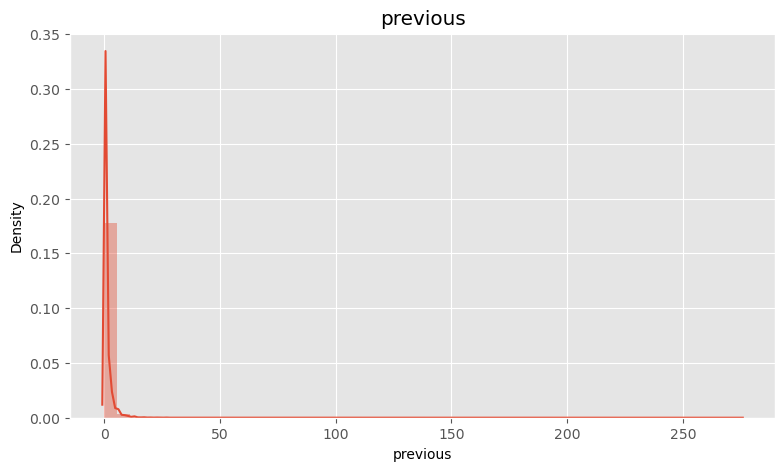

In [11]:
for column in numeric_col:
    plt.figure(figsize=(20,5))
    plt.subplot(121)
    sns.distplot(df[column])
    plt.title(column)

<font size='3'>**Bivariate Analysis - Categorical Columns**

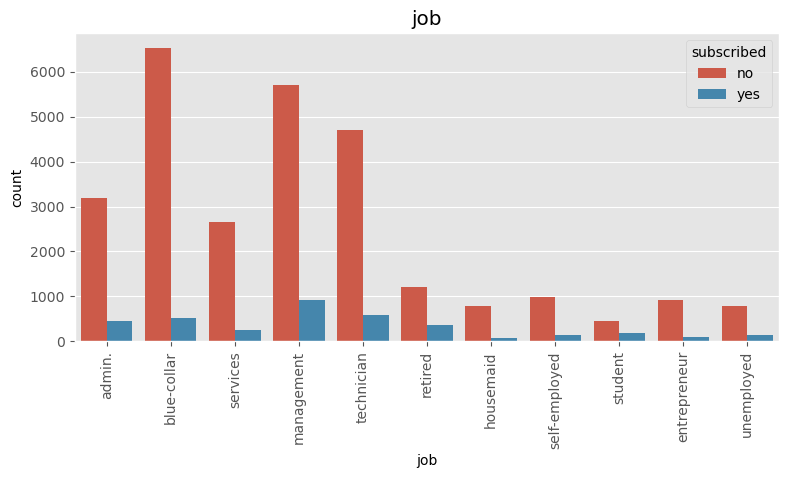

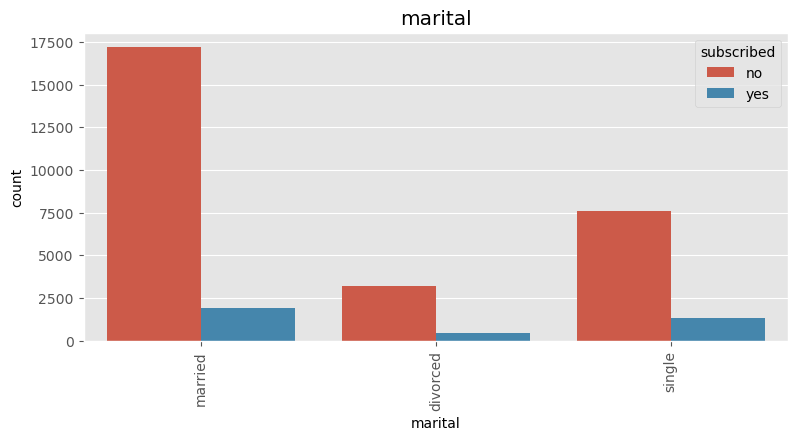

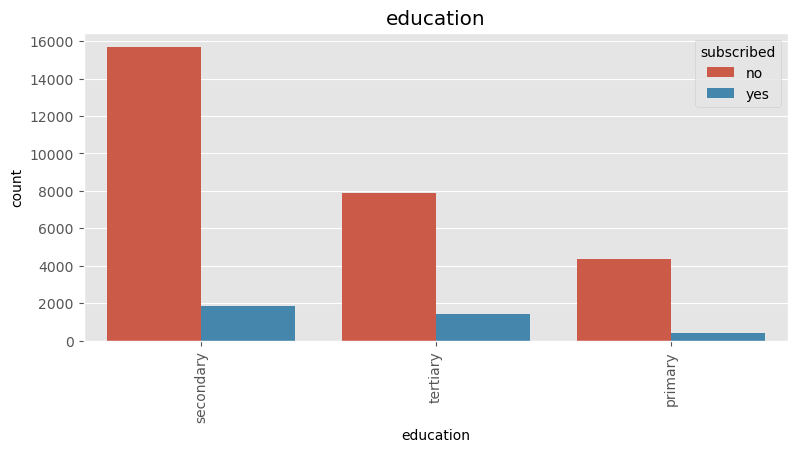

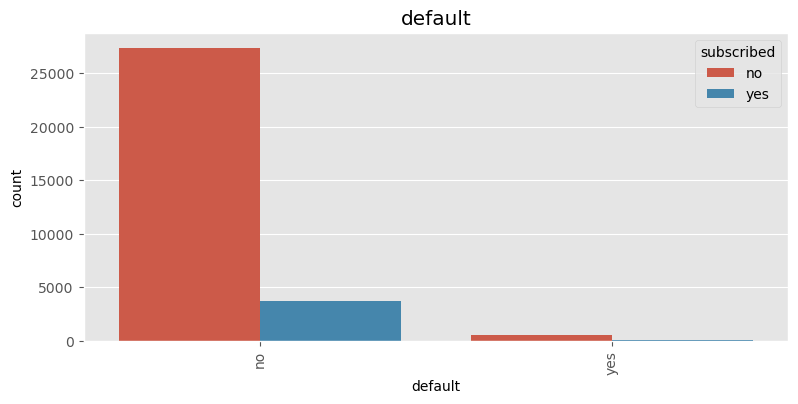

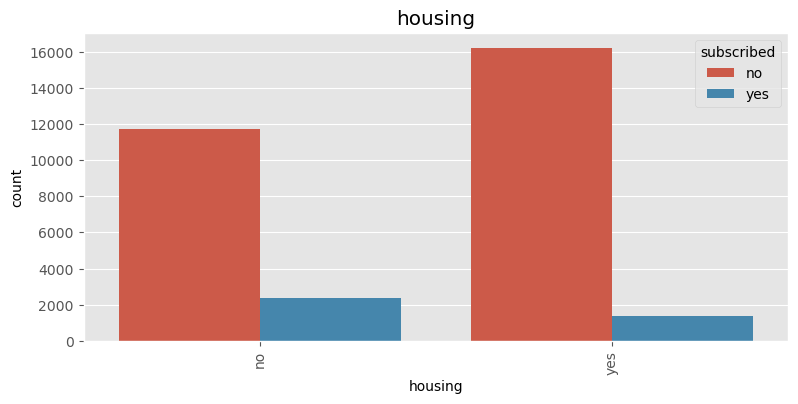

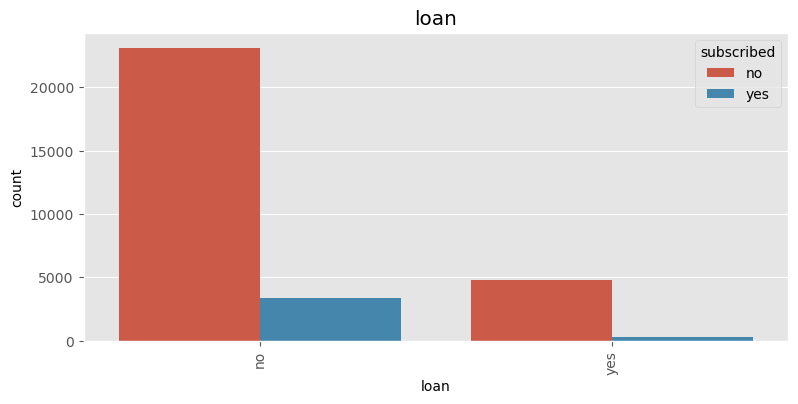

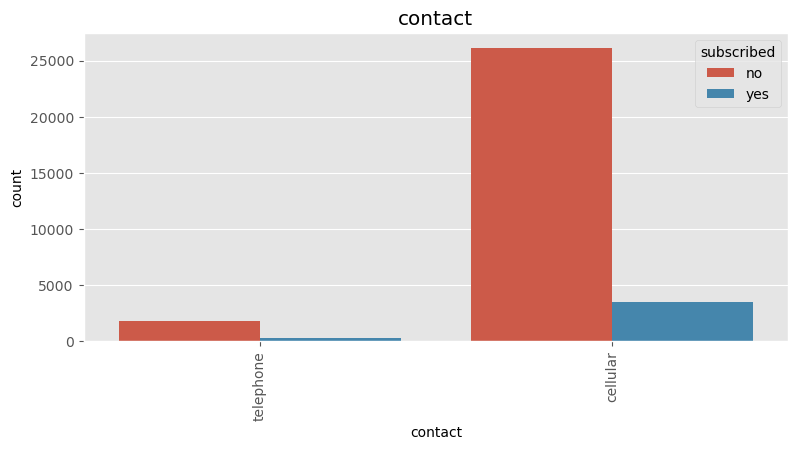

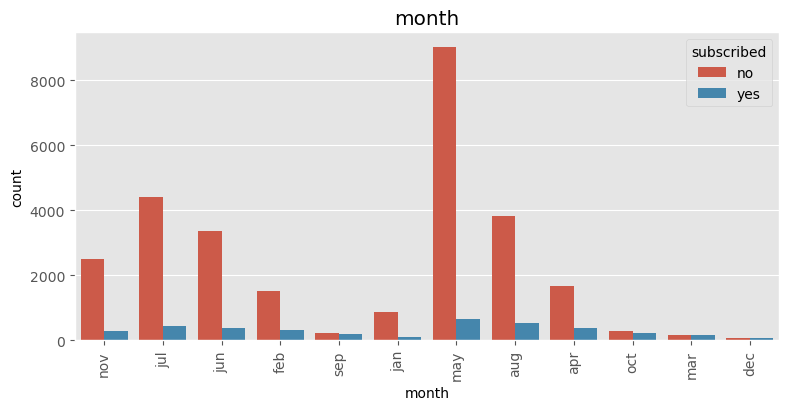

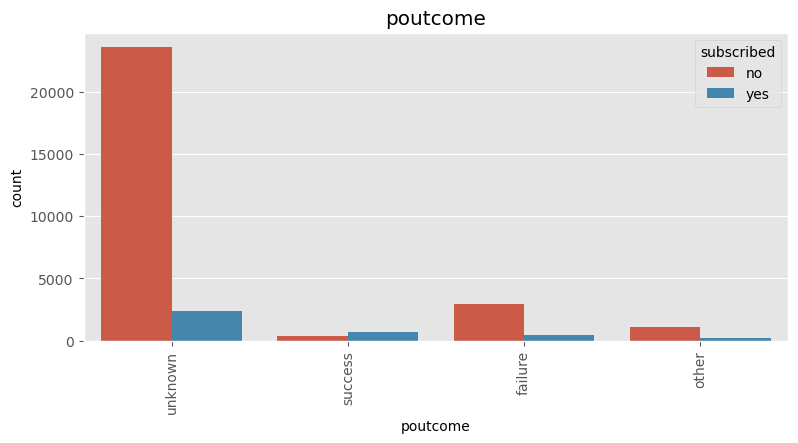

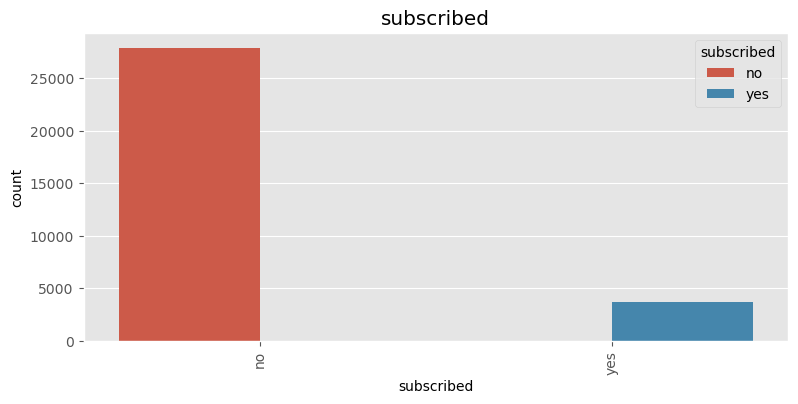

In [12]:
for column in categorical_col:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    sns.countplot(x=df[column],hue=df['subscribed'],data=df)
    plt.title(column)    
    plt.xticks(rotation=90)

<font size='3'>**Observations:**

- The common traits seen for customers who have subscribed for the term deposit are :

- Customers having management jobs form the majority amongst those who have subscirbed to the term deposit with technicians   being the second majority.

- They are married

- They hold a university degree

- They do not hold a credit in default

- Housing loan doesn't seem a priority to check for since an equal number of customers who have and have not subscribed to it     seem to have subscribed to the term deposit.

- Cell-phones should be the preferred mode of contact for contacting customers.

<font size='4'>**Label Encode Categorical variables**

In [13]:
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,StandardScaler
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
pd.set_option('display.max_columns',None)
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [14]:
le = LabelEncoder()

for feature in categorical_col:
    try:
        df[feature] = le.fit_transform(df[feature])
    except:
        print('Error encoding '+feature)

In [15]:
df.to_csv('termdeposit_train.csv',index=False)

In [16]:
from ydata_profiling import ProfileReport

In [17]:
prof = ProfileReport(df)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
df

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,0,1,1,0,1933,0,0,1,19,9,44,2,-1,0,3,0
1,40576,31,1,1,1,0,3,0,0,0,20,5,91,2,-1,0,3,0
2,15320,27,7,1,1,0,891,1,0,0,18,5,240,1,-1,0,3,0
3,43962,57,4,0,2,0,3287,0,0,0,22,6,867,1,84,3,2,1
4,29842,31,9,1,1,0,119,1,0,0,4,3,380,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,4,2,2,0,0,1,0,0,12,8,116,2,-1,0,3,0
31643,40178,53,4,0,2,0,380,0,1,0,5,6,438,2,-1,0,3,1
31644,19710,32,4,2,2,0,312,0,0,0,7,1,37,3,-1,0,3,0
31645,38556,57,9,1,1,0,225,1,0,1,15,8,22,7,337,12,0,0


# Machine Learning Models

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier ,RandomForestClassifier ,GradientBoostingClassifier
from xgboost import XGBClassifier 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import Ridge,Lasso
from sklearn.metrics import roc_auc_score ,mean_squared_error,accuracy_score,classification_report,roc_curve,confusion_matrix
from sklearn.feature_selection import RFE

<font size='4'>**THE TRAIN AND TEST DATA**

In [20]:
X = df.iloc[:,:-1]

y = df.iloc[:,-1]

x_train,x_val,y_train,y_val = train_test_split(X,y,test_size=0.3,random_state=5)

<font size='5'>**Logistic Regression**

In [21]:
model = LogisticRegression()

model.fit(x_train, y_train)

y_scores = model.predict(x_val)

ROC_AUC_SCORE is 0.60068577936225


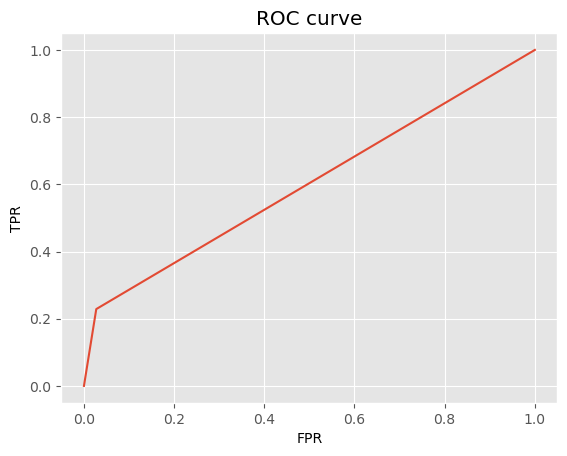

In [22]:
auc = roc_auc_score(y_val, y_scores)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_scores)
print('ROC_AUC_SCORE is',roc_auc_score(y_val, y_scores))

    
plt.plot(false_positive_rate, true_positive_rate)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

<font size='5'>**Decision Tree**

In [23]:
model = DecisionTreeClassifier()

model.fit(x_train, y_train)
y_scores = model.predict(x_val)

ROC_AUC_SCORE is 0.7199891067538127


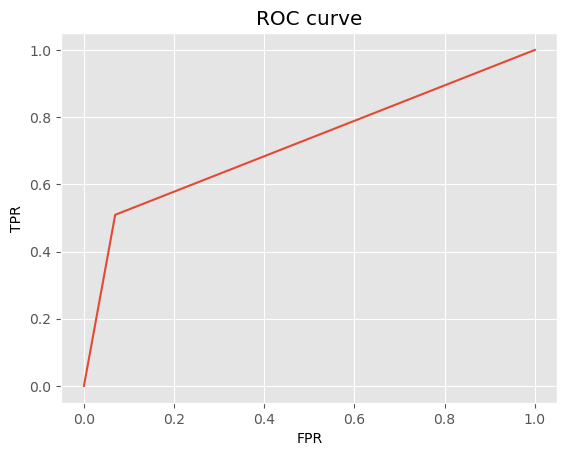

In [24]:
auc = roc_auc_score(y_val, y_scores)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_scores)
print('ROC_AUC_SCORE is',roc_auc_score(y_val, y_scores))
    
plt.plot(false_positive_rate, true_positive_rate)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

<font size='5'>**Random Forest**

In [25]:
model = RandomForestClassifier()

model.fit(x_train, y_train)
y_scores = model.predict(x_val)

ROC_AUC_SCORE is 0.7286368587839176


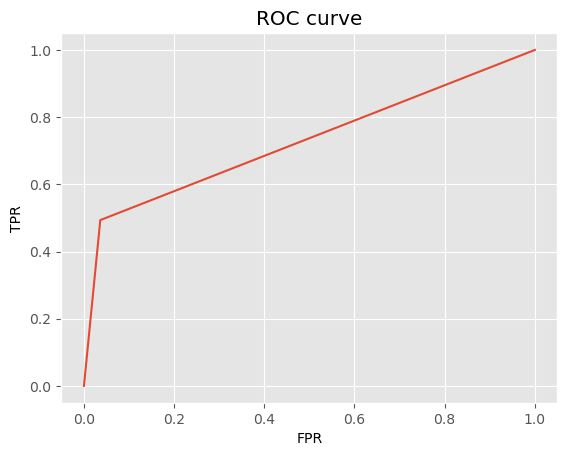

In [26]:
auc = roc_auc_score(y_val, y_scores)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_scores)
print('ROC_AUC_SCORE is',roc_auc_score(y_val, y_scores))
    
plt.plot(false_positive_rate, true_positive_rate)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

# Hyper Tuning

In [27]:
x_train,x_val,y_train,y_val = train_test_split(X,y, test_size=0.3, random_state=42, stratify=y)

rfc = RandomForestClassifier()
param_grid = { 
'max_features': ['auto', 'sqrt', 'log2'],
'max_depth' : [4,5,6,7,8],
'criterion' :['gini', 'entropy']
             }

grid_search_model = GridSearchCV(rfc, param_grid=param_grid)
grid_search_model.fit(x_train, y_train)
print('Best Parameters are:',grid_search_model.best_params_)

Best Parameters are: {'criterion': 'gini', 'max_depth': 8, 'max_features': 'auto'}


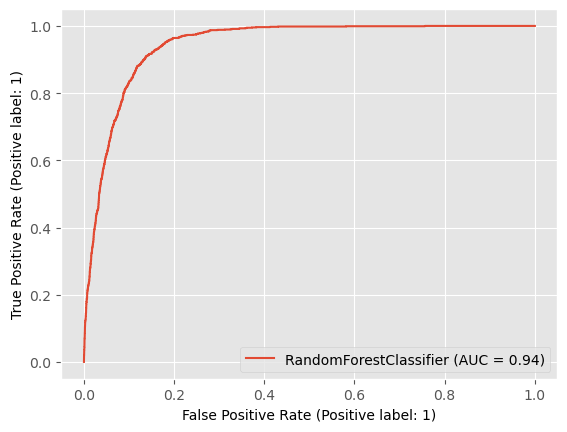

In [28]:
from sklearn.metrics import roc_auc_score,roc_curve,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

rfc = RandomForestClassifier(max_features='auto', max_depth=8, criterion='gini',random_state=42)
rfc.fit(x_train, y_train)
    
rfc_disp = RocCurveDisplay.from_estimator(rfc,x_val,y_val)
plt.show()

# Test Dataset

<font size='4'>**Prediction on the Test Data**

In [29]:
df1 = pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Bank%20Marketing/termdeposit_test.csv")

In [30]:
df1

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,38441,32,services,married,secondary,no,118,yes,no,cellular,15,may,20,6,-1,0,unknown
1,40403,78,retired,divorced,primary,no,2787,no,no,telephone,1,jul,372,1,-1,0,unknown
2,3709,31,self-employed,single,tertiary,no,144,yes,no,unknown,16,may,676,1,-1,0,unknown
3,37422,57,services,single,primary,no,3777,yes,no,telephone,13,may,65,2,-1,0,unknown
4,12527,45,blue-collar,divorced,secondary,no,-705,no,yes,unknown,3,jul,111,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,23465,39,management,married,tertiary,no,45,no,no,cellular,28,aug,148,4,-1,0,unknown
13560,11743,54,blue-collar,married,primary,no,2281,yes,no,unknown,20,jun,158,1,-1,0,unknown
13561,28292,35,retired,married,primary,no,285,yes,no,cellular,29,jan,136,1,-1,0,unknown
13562,45163,29,admin.,single,secondary,no,464,no,no,cellular,9,nov,208,2,91,3,success


<font size='3'>**Label Encoding**

In [31]:
le = LabelEncoder()

for feature in categorical_col:
    try:
        df1[feature] = le.fit_transform(df1[feature])
    except:
        print('Error encoding '+feature)

Error encoding subscribed


In [32]:
df1.to_csv('termdeposit_test.csv',index=False)

In [33]:
prof = ProfileReport(df1)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
df1

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,38441,32,7,1,1,0,118,1,0,0,15,8,20,6,-1,0,3
1,40403,78,5,0,0,0,2787,0,0,1,1,5,372,1,-1,0,3
2,3709,31,6,2,2,0,144,1,0,2,16,8,676,1,-1,0,3
3,37422,57,7,2,0,0,3777,1,0,1,13,8,65,2,-1,0,3
4,12527,45,1,0,1,0,-705,0,1,2,3,5,111,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,23465,39,4,1,2,0,45,0,0,0,28,1,148,4,-1,0,3
13560,11743,54,1,1,0,0,2281,1,0,2,20,6,158,1,-1,0,3
13561,28292,35,5,1,0,0,285,1,0,0,29,4,136,1,-1,0,3
13562,45163,29,0,2,1,0,464,0,0,0,9,9,208,2,91,3,2


<font size='3'>**Predicting the test data**

In [35]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_sm, y_sm =  smote.fit_resample(x_train, y_train)

rfc = RandomForestClassifier(max_features='log2', max_depth=8, criterion='gini',random_state=42)

rfc.fit(X_sm,y_sm)

y_pred = rfc.predict(df1)

prediction = pd.DataFrame(y_pred,columns=['subscribed'])

<font size='4'>**Final Result**

In [36]:
a = df1['ID']
df = pd.DataFrame()
df["ID"] = a
df["Subscribed"] = prediction
df

,ID,Subscribed
0,38441,0
1,40403,1
2,3709,0
3,37422,0
4,12527,0
...,...,...
13559,23465,0
13560,11743,0
13561,28292,0
13562,45163,1


<font size='3'>**Here,**
    
    [ Subscribed ]
    
    0 = No
    
    1 = Yes